<a href="https://colab.research.google.com/github/liordanon/Gradient-Descent-Tutorial/blob/master/Gradient_Descent_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Abstract***

In many scientific disciplines it is important to be able to compute parameters that minimize a function
typically called **loss** **cost** or **objective**.

Finding such parameters so that the function is minimized is called optimization for which many algorithms
over the years have been proposed.

Lately, because of the rise in computational power and prevasiveness of data, an algorithm 
called **Gradient Descent** has started to gain popularity more specifically, for the task of
"Optimization of parameters for a neural network" (explained later).

# **The algorithm**

Gradient descent is based on the observation that if the multi-variable function ${\displaystyle F(\mathbf {x} )} $ is defined and differentiable in a neighborhood of a point ${\displaystyle \mathbf {a} }$  , then $F(\mathbf {x} ) $ decreases fastest if one goes from ${\displaystyle \mathbf {a} }$  in the direction of the negative gradient of ${\displaystyle F} $ at ${\displaystyle \mathbf {a} }  , {\displaystyle -\nabla F(\mathbf {a} )} $. 

It follows that, if

${\displaystyle \mathbf {a} _{n+1}=\mathbf {a} _{n}-\gamma \nabla F(\mathbf {a} _{n})} $
for ${\displaystyle \gamma \in \mathbb {R} _{+}}$ small enough, then ${\displaystyle F(\mathbf {a_{n}} )\geq F(\mathbf {a_{n+1}} )}$.

**Note** : the constant ${\gamma}$ is very often called the **learning rate**.

# Lets look at a Simpler case

if ${\displaystyle F(\mathbf {x} )} $ is a function of only one value then it is the case that.

$ {\displaystyle \nabla F(\mathbf {a} )} $ = ${\displaystyle \frac{dF}{dx}}$

***let's look at the function $\displaystyle y = x^2$ ***

It than implies that ${\displaystyle \frac{dy}{dx}} = \displaystyle 2x$

hence for an initial gauess of $\mathbf {a_{n}} = {\displaystyle \mathbf {x} _{0}}$

the iteration associated with the Gradient Descent iteration is ${\displaystyle \mathbf {a} _{n+1}=\mathbf {a} _{n}-\gamma 2x } $
for ${x = \mathbf {a} _{n}}$ and for some small ${\gamma}$ .

let's choose ${\gamma}$ = 0.1 and an initial gauess of ${\displaystyle \mathbf {x} _{0}} = 7$ and see what happens.


In [0]:
#@title animation1

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

x = np.linspace(-8, 8, 1000)
y = x**2

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-8, 8))
ax.set_ylim((-10, 64))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 7

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  point.set_data(x0, x0**2)
  
  x0 = x0 - 0.1*2*x0
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(20), blit=True)

HTML(anim1.to_jshtml())
  

**As we can see the value of x goes toward 0 which is where the minimum, both local and global minima in this case, 
of this function is. **



#**The Local Minima Problem**

As we have shown the iteration converges onto a minima of the function (upto a certain environment of the minima).

The thing is, that most real world functions have many minima points and not only one like $y$ = $x^2$.

lets see what happens when we do the iteration on the function $y = \left(x-2\right)\cdot\left(x-1\right)\cdot x\cdot\left(x+2\right)$ with initial guess ${\displaystyle \mathbf {x} _{0}} = 2.5$

we can compute that ${\displaystyle \frac{dy}{dx}} = \displaystyle 4x^3-3x^2-8x+4$
and so the iteration becomes ${\displaystyle \mathbf {a} _{n+1}=\mathbf {a} _{n}-\gamma (4x^3-3x^2-8x+4 }) $
for ${x = \mathbf {a} _{n}}$ 

Now let's  set ${\gamma}$  = 0.01 and observe the animation

In [0]:
#@title animation2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

x = np.linspace(-8, 8, 1000)
y = x*(x-1)*(x-2)*(x+2)

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-4, 4))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  point.set_data(x0, x0*(x0-1)*(x0-2)*(x0+2))
  
  x0 = x0 - 0.01*(4*x0**3-3*x0**2-8*x0+4)
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(20), blit=True)

HTML(anim1.to_jshtml())

**OH NOOO !!!** as we can see our Gradient Descent iteration converged on a **local minimum** of the function 
but it did not converge on the **global minimum** of the function.

this is exactly the local minimum problem, the iteration converges on a minimum of the function but not on it's lowest value.

**what should we do ?**

there have been many ways to combat this problem over the years and some of the most common are :

* to tune/change the learning rate.
* to ignore the problem, sometimes a local minima is ok and even desired.
* to change the iteration formula to converge both **faster** and to a better **minima** (explained later).

# Failure To Converge

Another problem regarding gradient descent is that in most real world applications, there is no guarantee
that the iteration will converge to the minima.

to see this in action lets see what happens when we up the learning rate in the previous example
from 0.01 to 0.1.

In [0]:
#@title animation3

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

x = np.linspace(-8, 8, 1000)
y = x*(x-1)*(x-2)*(x+2)

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-4, 4))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  point.set_data(x0, x0*(x0-1)*(x0-2)*(x0+2))
  
  x0 = x0 - 0.1*(4*x0**3-3*x0**2-8*x0+4)
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(20), blit=True)

HTML(anim1.to_jshtml())

As we can see the iteration has failed to converge and is jumping back and fourth aroung a minima
without actually reaching it.

This phenomenon only adds to the reasons that plain old gradient descent is much less used today and
has been replaced by it's out-performing variants which we will discuss more in detail shortly.

***Note : some thing we can see from this animation is that upping the learning rate, even though it prevented convergence, the bigger steps taken at the start by the iteration prevented it from getting stuck on a local minima and helped it reach the global minima.***

this trade-off between exploration of new and possibly better maxima and exploitation of our current neighborhood for convergence is
seen a lot across the optimization landscape (not only in gradient descent) and is under constant research and development.




# **alternative formulas**

ther have been plenty of gradient descent formulas/methods that have been used in order to enhance the performance,
and find better minima faster (and to converge more easily).

In this chapter we will discuss some of the most common ones, namely :

* learning rate decay
* the momentum method
* RMSprop
* adam

# Learning Rate Decay

learning rate decay is a method that helps address the "failure to converge" problem discussed previously.
it does so by lowering the learning rate on each iteration of the algorithm, thus basically taking shorter 
steps each iteration which helps prevent bouncing around the minima.

There are plenty of formular used for learning rate decay, examples of such formulas are :

* ${\displaystyle \gamma _{n+1}={\frac {\gamma _{n}}{1+dn}}}$ where ${\displaystyle \gamma }$  is the learning rate, ${\displaystyle d}$ is a decay parameter and ${\displaystyle n}$ is the iteration step.

* ${\displaystyle \gamma _{n}=\gamma _{0}d^{floor({\frac {1+n}{r}})}}$

let's see this in action on the previous example using the first formula for decay and an initial
learning rate of ${\gamma = 0.1}$. 

In [0]:
#@title animation4

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

x = np.linspace(-8, 8, 1000)
y = x*(x-1)*(x-2)*(x+2)

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-4, 4))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5
learning_rate = 0.1

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  
  global x0
  global learning_rate
  
  point.set_data(x0, x0*(x0-1)*(x0-2)*(x0+2))
  
  x0 = x0 - learning_rate*(4*x0**3-3*x0**2-8*x0+4)
  learning_rate = learning_rate/(1 + 0.1*i)
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(20), blit=True)

HTML(anim1.to_jshtml())

As we can see taking smaller and smaller steps close to the minima prevented the iteration from bouncing
around the minima and helped it  converge.

# The Momentum Method

The Momentum Method is method that relies on the principle that if for several iterations the gradient has pointed roughly at the same direction, then it is possible  that this direction is worth exploring and advancing more towards.

The method's name arises from how similar it operates to real life momentum , if one has a high momentum in a certain direction,
it would be harder to change it towards another direction.

this technique is implemented by updating the parameters with the **Exponentially Weighted Average** of 
the gradients instead of using only the last gradient computed.

$v_{n+1} = {\beta}v_{n} + (1-{\beta}){\nabla}F(X)$ # keeping track of the **Exponentially Weighted Average** of the gradient.

$a_{n+1} = a_{n} - {\gamma}v_{n+1}$ # using it for the update instead of the gradient itself.

Note : typically a value of ${\beta} = 0.9$ is chosen. 

for an example of why this method might be useful lets look at the following animation

In [0]:
#@title animation4

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

x = np.linspace(-100,100 , 10000)
y = x*(x-1)*(x-2)*(x+2)

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-4, 4))
ax.set_ylim((-10, 75))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 3.5
S = 0
beta = 0.9


def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  
  global x0
  global S
  
  point.set_data(x0, x0*(x0-1)*(x0-2)*(x0+2))
  grad = (4*x0**3-3*x0**2-8*x0+4)
  S = (1-beta)*grad + beta*S
  x0 = x0 - 0.01*S
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(50), blit=True)

HTML(anim1.to_jshtml())

As you can see even when the iteration was at a place with negative gradient the dot kept goint "up the hill"
because it had **Momentum** and thus reaching the global minima. 

# Plateaus

in order to advance and understand more sophisticated types of algorithms (specifically adaptive gradient algorithms) 
we need to first understand the problem of plateaus.

when using gradient descent you might enter a region in the function the has very low gradient (that is, very close to 0) aka a **plateau**.
the problem with this is that on such regions your iteration will move very slightly and it would take a lot of time for it to advance.

to see this, let's look at the following animation of a gradient descent iteration trying to advance on
the surface of the function $y = e^{-x}$ towards some minima put at the end using the regular gradient descent algorithm
and a learning rate set to $\gamma = 0.1$.



In [0]:
#@title animation5

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

def func(x, der=False):
  if der == False:
    return np.exp(-x) if not 5< x<7 else (x-5)*(x-7)
  else:
    return -np.exp(-x) if not 5< x<7 else 2*x-12
  
x = np.linspace(-2, 8, 1000)
y = np.array(list(map(func, x)))

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-2, 8))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  point.set_data(x0, func(x0))
  
  x0 = x0 - 0.1*(func(x0,der = True))
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(50), blit=True)

HTML(anim1.to_jshtml())

As we can see since the gradient (derivative ) of the function is so close to zero,
every update of the parameter only moves it by a tiny bit.

to fix such problems and achieve fast convergence to the minimum a class of gradient descent algorithms called
**"Adaptive Gradient Methods"** that help overcome this problem.

# RMSprop

first lets look at the algorithm :

* keep track of the Exponentially Weighted Avegrage of the **Squares** of the gradient (marked EWA) ($\beta$ is chosen in advance like in the momentum method)
* the update is then $X = X - {\gamma}{\frac{{\nabla}F(X)}{\sqrt{EWA} + \epsilon}}$ where ${\gamma}$ is the learning rate and ${\epsilon}$ is a very small number to prevent division by zero .

lets see this in action on a plateau.

In [0]:
#@title animation6

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

def func(x, der=False):
  if der == False:
    return np.exp(-x) if not 5< x<7 else (x-5)*(x-7)
  else:
    return -np.exp(-x) if not 5< x<7 else 2*x-12
  
x = np.linspace(-2, 8, 1000)
y = np.array(list(map(func, x)))

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-2, 8))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5
m = 0
beta = 0.9

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  global m
  global beta
  
  epsilon = 10**(-8)
  
  point.set_data(x0, func(x0))
  
  m = beta*m + (1 - beta)*func(x0,der = True)**2
  x0 = x0 - 0.1*(func(x0,der = True)/np.sqrt(m + epsilon))
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(50), blit=True)

HTML(anim1.to_jshtml())

As we can see the RMSProp optimizer was able to converge on the minimum despite the plateau.

But Why ?

Well lets think for a second on what happens after a couple of iterations on the plateau.

After enough iterations the $\sqrt{EWA}$ is close to the value of the gradient on the plateau.

the the value by which we are updating i.e. ${\frac{{\nabla}F(X)}{\sqrt{EWA} + \epsilon}}$ is a small number 
divided by a small number of roughly the same magnitude  so even though the gradient is very low we update by a "normalized"
gradient (not actual normalization) that is not that low.

# Adam

The adam optimizer is another optimizer from the adaptive gradient family that is heavily used in the deep learning community.

It is an improvement to other methods (like RMSProp) that uses the Exponentialy Weighted Average of both the gradient and the square of the gradient instead of only one of them.

for this algorithm on top of the learning rate we need to define two parameters $\beta_{1}$ and $\beta_{2}$ for the two seperate 
exponentially weighted average.

the formulas then become :

${\displaystyle m_{X}^{(t+1)}\leftarrow \beta _{1}m_{X}^{(t)}+(1-\beta _{1})\nabla _{X}L^{(t)}}$

${\displaystyle v_{X}^{(t+1)}\leftarrow \beta _{2}v_{X}^{(t)}+(1-\beta _{2})(\nabla _{X}L^{(t)})^{2}}$

${\displaystyle {\hat {m}}_{X}={\frac {m_{X}^{(t+1)}}{1-(\beta _{1})^{t+1}}}}$

${\displaystyle {\hat {v}}_{X}={\frac {v_{X}^{(t+1)}}{1-(\beta _{2})^{t+1}}}}$

${\displaystyle X^{(t+1)}\leftarrow X^{(t)}-\gamma {\frac {{\hat {m}}_{X}}{{\sqrt {{\hat {v}}_{X}}}+\epsilon }}}$ 





In [0]:
#@title animation7

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

def func(x, der=False):
  if der == False:
    return np.exp(-x) if not 5< x<7 else (x-5)*(x-7)
  else:
    return -np.exp(-x) if not 5< x<7 else 2*x-12
  
x = np.linspace(-2, 8, 1000)
y = np.array(list(map(func, x)))

fig, ax = plt.subplots(figsize=(10, 10))
plt.close()

ax.set_xlim((-2, 8))
ax.set_ylim((-10, 15))
line, = ax.plot([], [], lw=2)
point, = ax.plot([], [], '*', color = 'red', markersize = 10)

x0 = 2.5
m1 = 0
m2 = 0
beta1 = 0.9
beta2 = 0.9

def init():
    line.set_data(x, y)      
    return (line,)
  
def animate(i):
  global x0
  global m1
  global m2
  global beta1
  global beta2
  
  epsilon = 10**(-8)
  
  point.set_data(x0, func(x0))
  
  m1 = beta1*m1 + (1 - beta1)*func(x0,der = True)
  m2 = beta2*m2 + (1 - beta2)*func(x0,der = True)**2
  
  n1 = 1 - beta1**(i+1)
  n2 = 1 - beta2**(i+1)
  
  m1_ = m1/n1
  m2_ = m2/n2
  
  x0 = x0 - 0.1*m1_/(np.sqrt(m2_) + epsilon)
  
  return [point]

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(70), blit=True)

HTML(anim1.to_jshtml())

At the end of the animation we can see the dot exhibiting momentum like behavior as it goes up the hill and back.
this is not a coincidence and is a direct result of the fact that much like momentum, adam uses the EWA of the gradient itself
(and not only of the square of the gradient) and uses it to update the parameters .

# Multivariate Optimization

As previously stated Gradient Descent is an algorithm for optimization of several prameters and not necessarily 1 parameter like shown in the previous examples.

As such we can optimize functions that take in multiple parameters (most notably artificial neural networks that often have thousands of parameters to optimize).

In the following example i will hopefully help you further understand the concept of multivariable optimization. 



# Linear Regression

Problem Statement : Given a set containing n $(x, y)$ coordinates find a line that best fits the points.

**Solution** :

* define the function $J = \sum_{i=1}^{n} (y_{i} - (mx_{i} +b))^2$ # called the error/loss function.
* compute ${\nabla}J = (\frac{\partial J}{\partial b}, \frac{\partial J}{\partial m})$
* update the state vector $X = (b, m)$ using one of the gradient descent methods.
* repeat until convergence.

**Note** - this example is brought as an educational resource. the least square fit of a set of points could
much more easily be calculated with simple linear algebra.

In [0]:
#@title animation8

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

np.random.seed(0)

x = np.linspace(0, 1, 100)
y = 2*x+1 + 0.2*np.random.randn(x.size)

fig, ax = plt.subplots(figsize = (10, 10))
plt.close()

ax.set_xlim((0, 1))
ax.set_ylim((-1, 4))
line, = ax.plot([], [], lw=2)
points, = ax.plot([], [], '*', color = 'red', markersize = 10)

m = np.random.random()
b = np.random.random()

Mm = 0
Mb = 0

def init():
  global x
  global y
  global points
  
  points.set_data(x, y)
  return (points,)

def animate(i):
  global m
  global b
  global line
  global x
  global y
  global Mb
  global Mm
  
  line.set_data(x, m*x+b)
  
  # using RMSProp for gradient descent
  
  db = -2*np.mean(y-(m*x + b))
  dm = 2*np.mean((y-(m*x + b))*(-x))
  
  Mm = 0.9*Mm + 0.1*dm**2
  Mb = 0.9*Mb + 0.1*db**2
  
  b = b - 0.05*db/(np.sqrt(Mb) + 10**(-8))
  m = m - 0.05*dm/(np.sqrt(Mm) + 10**(-8))
  
  return (line,)

anim1 = animation.FuncAnimation(fig, animate, init_func=init, frames=range(80), blit=True)

HTML(anim1.to_jshtml())




# Even More Parameters

The first Example showed you a case where we needed to optimize more then one parameter (specifically two).

The thing is, that as i told you gradient descent is usually used to optimize many parameters.

Lets see an example that requires gradient descent to optimize an entire $N$x$N$ matrix (4x4 in our example). 


In linear algebra and numerical analysis courses (and many more) we have seen the importance of finding the inverse of a matrix.

lets see how gradient descent can help us in doing so.

as we have seen in our previous example, the first seen to do is to define the objective (cost) function.

in our case, for a matrix **A** and guess of inverse **M** a good function would be $J = \sum (MA_{ij} - I_{ij})*(MA_{ij} - I_{ij})$.

with a bit of matrix calculus (not explained for time restraints) we can calculate that $\frac{\partial{J}}{\partial M} = 2(MA - I)A^T$

now we are ready to minimize the cost function and find $A^{-1}$

let's look at the value of $MA$ throughout the iterations.

(details : for fast convergence adam optimizer with learning rate $0.1$ and both beta's $0.9$ is used).


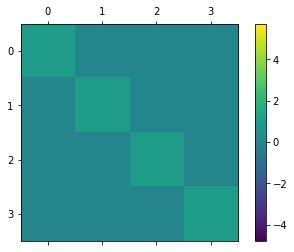

In [0]:
#@title animation9



import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import time

np.random.seed(0)

A = np.random.normal(size=(4, 4))
M = np.random.normal(size=(4, 4))
I = np.eye(4)
lr = 0.1


m1 = 0
m2 = 0
beta1 = beta2 = 0.9

def J(M, A, grad = False):
  global I
  
  if not grad:
    return np.sum((M.dot(A) - I)*(M.dot(A) - I))
  else:
    return 2*(M.dot(A) - I).dot(A.T)

fig, ax = plt.subplots()
matrice = ax.matshow(M.dot(A))
plt.colorbar(matrice)

def update(i):
  global M
  global A
  global I
  global matrice
  global lr
  global m1
  global m2
  global beta1
  global beta2
  
  dM = J(M, A, grad=True)
  
  epsilon = 10**(-8)
  
  m1 = beta1*m1 + (1 - beta1)*J(M, A, grad=True)
  m2 = beta2*m2 + (1 - beta2)*J(M, A, grad=True)**2
  
  n1 = 1 - beta1**(i+1)
  n2 = 1 - beta2**(i+1)
  
  m1_ = m1/n1
  m2_ = m2/n2
  
  M = M - lr*m1_/(np.sqrt(m2_) + epsilon)

  matrice.set_array(M.dot(A))
  return (matrice,)

  
  
anim1 = animation.FuncAnimation(fig, update, frames=range(300), blit=True)

HTML(anim1.to_jshtml())


In [0]:
#@title Is Close ?

print(np.allclose(M, np.linalg.inv(A), atol = 0.01)) # is M close to the inverse of A?

True


# Last Words 

In this tutorial we have explored the concept of gradient descent and its variants.

with that in mind, there are more methods and algorithms not covered in this tutorial you can now read on the internet having the basic foundation of gradient descent to guide you.

Hope You Enjoyed :)

authors : Lior Danon

Holon Institute of Technology.